In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import geopandas as gpd
import os

import datetime

In [30]:
from smoother import LinearTerm, DistanceSmoothing, KernelSmoothing
from gass import GASS 
from gass_da import GASS as GASSDA
from gass_bh import GASS as GASSBH

from pointpats import as_window, PoissonPointProcess
import libpysal as ps
from libpysal.cg import Point, Polygon

In [3]:
import datetime

In [4]:
# Compute the error term's standard deviation with p*100 % noise levels

def error_term_sdd(y_fitted, p):
    # Calculate variance of y_fitted
    var_systematic = np.var(y_fitted)


    
    # Calculate variance of error term using the derived formula
    var_error = p * var_systematic / (1-p)
    
    # Return standard deviation of the error term
    return np.sqrt(var_error)

# Stations

In [5]:
seed = 0
square = Polygon([Point((0, 0)), Point((0, 2000)), Point((2000, 2000)), Point((2000, 0))])
squwin = as_window(square)

# Destinations
np.random.seed(seed)
#𝑁-conditioned CSR:  𝑁 is fixed
squsamples = PoissonPointProcess(squwin, 150, 1, conditioning=False, asPP=False)
squpts_random = squsamples.realizations[0]

# Create DataFrame
random_df = pd.DataFrame(squpts_random, columns = ['Lon', 'Lat'])
random_df = random_df.assign(Name = np.arange(random_df.shape[0]))
digits = len(str(150))
random_df.Name = random_df.Name.astype(str).str.zfill(digits).apply(lambda x: "{}{}".format('R', x))

# Add attributes, X1 and X2
np.random.seed(seed)
attr1 = np.random.uniform(2, 100, 150)
np.random.seed(seed)
attr1 = np.random.uniform(100, 500, 150)#np.random.choice([-1, 1], size=len(random_df))
attr3 = np.ones(150) #np.random.choice([-1, 1], size=len(random_df))

random_df = random_df.assign(X1 = attr1, X2 = attr1, X3 = attr3)

# Create GeoDataFrame
random_gdf = gpd.GeoDataFrame(random_df.copy(), geometry=gpd.points_from_xy(random_df.Lon, random_df.Lat))

# POIs

In [6]:
POIs_list=[]
# intv = 400 # window size = intv * 2 
intv = 50 # window size = intv * 2 

for i in range(len(squpts_random)):
    
    cen_x = squpts_random[i][0]
    cen_y = squpts_random[i][1]

    subsquare = Polygon([Point((cen_x-intv, cen_y-intv)), Point((cen_x-intv, cen_y+intv)), Point((cen_x+intv, cen_y+intv)), Point((cen_x+intv, cen_y-intv))])
    subsquwin = as_window(subsquare)

    np.random.seed(i)
    subsqusamples = PoissonPointProcess(subsquwin, 8, 1, conditioning=False, asPP=False)
    subsqupts_random = subsqusamples.realizations[0]
    subsqupts_random_df = pd.DataFrame(subsqupts_random, columns = ['Lon', 'Lat'])

    POIs_list.append(subsqupts_random_df)

#Create DataFrame
pois_df = pd.concat(POIs_list, axis=0, ignore_index=False)
pois_df = pd.DataFrame(pois_df, columns = ['Lon', 'Lat'])
pois_df = pois_df.assign(Name = np.arange(pois_df.shape[0]))
digits = len(str(1200))
pois_df.Name = pois_df.Name.astype(str).str.zfill(digits).apply(lambda x: "{}{}".format('I', x))

#Add attribute
pois_df = pois_df.assign(attr1 = np.ones(1200))
np.random.seed(seed)
pois_df = pois_df.assign(attr2 = np.random.uniform(50, 100, 1200))

#Create GeoDataFrame
pois_gdf = gpd.GeoDataFrame(pois_df.copy(), geometry=gpd.points_from_xy(pois_df.Lon, pois_df.Lat))

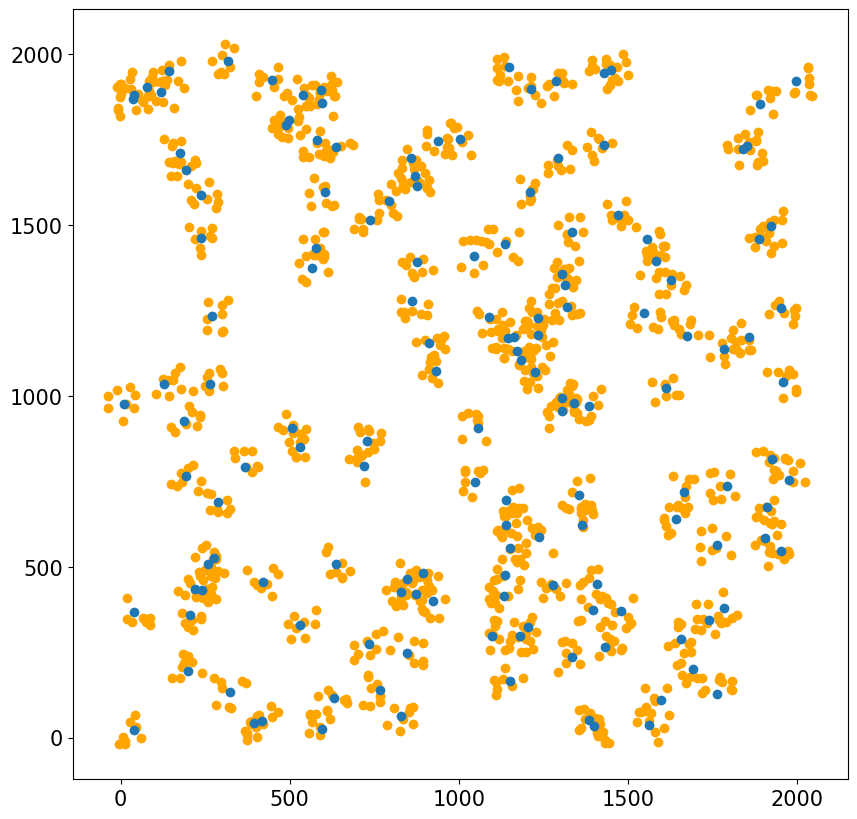

In [7]:
fig, ax = plt.subplots(figsize = (10,10))

plt.plot(np.array(pois_gdf['Lon']), np.array(pois_gdf['Lat']), 'o', color='orange')
plt.plot(np.array(random_gdf['Lon']), np.array(random_gdf['Lat']), 'o')

ax.tick_params(axis='both', which='major', labelsize=15)
#ax.legend(['Explanatory Variable (POIs)', 'Depedent Variable (Stations)'], fontsize = 15)#, loc='upper left', bbox_to_anchor=(1, 0))  


Conversion: by default, the weighted sum will be standardized

# DGP 1: without noise

In [8]:
lin_sd = LinearTerm(random_gdf, 1, standard = True)

In [11]:
ksgk_X2_sd = KernelSmoothing(
    data1 = random_gdf, ids1=None, ids2=None, attr='X2',
    distance_metric = 'euclidean', binary = False, kernel_function='gaussian',
    initial_k = 1, self_neighboring = True, row_standard = False, 
    log=False, standard=True, average = False,
    lower_bound = None, upper_bound = None, CI_step = None)

In [12]:
ksgk_pois_sd = KernelSmoothing(
    data1 = random_gdf, data2 = pois_gdf, ids1=None, ids2=None, attr='attr2',
    distance_metric = 'euclidean', binary = False, kernel_function='gaussian',
    initial_k = 1, self_neighboring = False, row_standard = False, 
    log = False, standard = True, average = False,
    lower_bound = None, upper_bound = None, CI_step = None)

In [13]:
sX2 = ksgk_X2_sd.cal(50)

In [14]:
sPOI = ksgk_pois_sd.cal(8)

In [15]:
X = np.hstack((lin_sd.X, sX2, sPOI))
coefs = np.array([1, 1, 1])
y_fitted = np.dot(X, coefs)
y = y_fitted #+ error_term_sdd(y_fitted, 0.05)
y = y.flatten()

## Golden Section Search

In [17]:
gass = GASS(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gass.fit(printed = True, verbose = True)

/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


Running fit for Gaussian ...
95.0 420.94748071757255
138.0 409.07859290356134
Current iteration: 1 ,SOC: 0.16047833
68.0 405.6042937692775
136.0 405.4688931724744
Current iteration: 2 ,SOC: 0.02894977
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 3 ,SOC: 0.00011081
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 4 ,SOC: 1.25e-06
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 5 ,SOC: 1e-08
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 1 ,SOC: 0.0
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 1 ,SOC: 0.0


In [18]:
print(gass.coefficients, gass.sigmas)

[[-5.68434189e-16]
 [ 9.33935883e-01]
 [ 1.07481015e+00]
 [ 4.06869510e-01]] [68.0, 136.0]


In [19]:
gass.calculate_AWCI_sigmas()

In [20]:
print(gass.AWCI_sigmas)

[(42.0, 129.0), (8.0, 8.0)]


## Basin hopping

In [31]:
gassbh = GASSBH(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gassbh.fit(printed = True, verbose = True)

/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


Running fit for Gaussian ...
74 421.93984454637854
601 431.5209703971857
Current iteration: 1 ,SOC: 0.08370555
73 431.31246371855855
597 431.33649120806206
Current iteration: 2 ,SOC: 0.00106208
73 431.33649120806206
595 431.32454439724836
Current iteration: 3 ,SOC: 3.8e-05
73 431.32454439724836
594 431.23344083011733
Current iteration: 4 ,SOC: 1.558e-05
73 431.2334408301174
595 431.32454439724836
Current iteration: 5 ,SOC: 1.534e-05
73 431.32454439724836
601 431.31246371855843
Current iteration: 6 ,SOC: 1.995e-05
73 431.31246371855855
597 431.33649120806206
Current iteration: 7 ,SOC: 1.18e-05
73 431.33649120806206
601 431.31246371855843
Current iteration: 8 ,SOC: 1.182e-05
73 431.31246371855855
601 431.31246371855843
Current iteration: 9 ,SOC: 3.4e-07
69 431.20807278634186
601 431.20807278634186
Current iteration: 10 ,SOC: 0.00166213
68 430.481123874442
601 430.481123874442
Current iteration: 11 ,SOC: 0.00031539
73 431.31246371855855
599 431.3371094275902
Current iteration: 12 ,SOC: 0.

In [32]:
print(gassda.coefficients, gassda.sigmas)

[[-2.0539126e-17]
 [ 1.0000000e+00]
 [ 1.0000000e+00]
 [ 1.0000000e+00]] [50, 8]


In [33]:
gassda.calculate_AWCI_sigmas()

/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

In [34]:
print(gassda.AWCI_sigmas)

[(50, 50), (8, 8)]


## Dual annealing

In [22]:
gassda = GASSDA(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gassda.fit(printed = True, verbose = True)

/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


Running fit for Gaussian ...
96 420.8811745860746
8 -69.40008852848378
Current iteration: 1 ,SOC: 0.57824123


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9814.716077395362


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9789.647352212614
Current iteration: 2 ,SOC: 0.01841707


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9814.716077395362


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9789.647352212614
Current iteration: 3 ,SOC: 2.38e-06


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9814.716077395362


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9789.647352212614
Current iteration: 4 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9814.716077395362


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9789.647352212614
Current iteration: 1 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9814.716077395362


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9789.647352212614
Current iteration: 1 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

In [23]:
print(gassda.coefficients, gassda.sigmas)

[[-2.0539126e-17]
 [ 1.0000000e+00]
 [ 1.0000000e+00]
 [ 1.0000000e+00]] [50, 8]


In [24]:
gassda.calculate_AWCI_sigmas()

/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

In [25]:
print(gassda.AWCI_sigmas)

[(50, 50), (8, 8)]


# DGP 2: 5% noise

In [35]:
X = np.hstack((lin_sd.X, sX2, sPOI))
coefs = np.array([1, 1, 1])
y_fitted = np.dot(X, coefs)
y = y_fitted + error_term_sdd(y_fitted, 0.05)
y = y.flatten()

## Golden Section Search

In [36]:
gass = GASS(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gass.fit(printed = True, verbose = True)

/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


Running fit for Gaussian ...
95.0 420.94748071757255
138.0 409.07859290356134
Current iteration: 1 ,SOC: 0.14808236
68.0 405.60429376927743
136.0 405.4688931724744
Current iteration: 2 ,SOC: 0.02655933
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 3 ,SOC: 0.00010283
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 4 ,SOC: 1.16e-06
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 5 ,SOC: 0.0
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 1 ,SOC: 0.0
68.0 405.4688931724744
136.0 405.4688931724744
Current iteration: 1 ,SOC: 0.0


In [37]:
print(gass.coefficients, gass.sigmas)

[[0.37351539]
 [0.93393588]
 [1.07481015]
 [0.40686951]] [68.0, 136.0]


In [38]:
gass.calculate_AWCI_sigmas()

In [39]:
print(gass.AWCI_sigmas)

[(42.0, 129.0), (8.0, 8.0)]


## Basin hopping

In [44]:
gassbh = GASSBH(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gassbh.fit(printed = True, verbose = True)

Running fit for Gaussian ...


/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


74 421.93984454637854
597 431.53979544887954
Current iteration: 1 ,SOC: 0.07704533
73 431.33649120806206
597 431.3364912080621
Current iteration: 2 ,SOC: 0.00096619
73 431.33649120806206
597 431.3364912080621
Current iteration: 3 ,SOC: 2.688e-05
73 431.33649120806206
601 431.3124637185585
Current iteration: 4 ,SOC: 1.113e-05
73 431.3124637185585
595 431.32454439724836
Current iteration: 5 ,SOC: 1.734e-05
68 430.51518990796717
601 430.481123874442
Current iteration: 6 ,SOC: 0.00200067
73 431.3124637185585
601 431.3124637185585
Current iteration: 7 ,SOC: 0.00195732
73 431.3124637185585
601 431.3124637185585
Current iteration: 8 ,SOC: 9.29e-06
73 431.3124637185585
601 431.3124637185585
Current iteration: 9 ,SOC: 1.5e-07
73 431.3124637185585
601 431.3124637185585
Current iteration: 10 ,SOC: 0.0
73 431.3124637185585
597 431.3364912080621
Current iteration: 1 ,SOC: 1.097e-05
74 431.5397954488796
595 431.52577272463714
Current iteration: 2 ,SOC: 0.00035019
73 431.32454439724825
601 431.312463

In [48]:
print(gassbh.coefficients, gassda.sigmas)

[[0.37351539]
 [0.93797594]
 [0.95416335]
 [0.05696668]] [50, 8]


In [49]:
gassbh.calculate_AWCI_sigmas()

In [52]:
print(gassbh.AWCI_sigmas)

[(13, 124), (8, 8)]


## Dual annealing

In [40]:
gassda = GASSDA(y, lin_sd, ksgk_X2_sd, ksgk_pois_sd, family = 'Gaussian', constant = True)
gassda.fit(printed = True, verbose = True)

Running fit for Gaussian ...


/home/jovyan/work/gass_03202025/smoother.py:291: RuntimeWarning: divide by zero encountered in divide
  nonzero_zmat = (diags(1 / bws).dot(k_dist_mat))


96 420.8811745860746
8 -69.40008852848378
Current iteration: 1 ,SOC: 0.53357561


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9787.111200803927


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9758.36796077353
Current iteration: 2 ,SOC: 0.01740224


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9787.111200803927


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9758.36796077353
Current iteration: 3 ,SOC: 2.27e-06


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9787.111200803927


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9758.36796077353
Current iteration: 4 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9787.111200803927


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9758.36796077353
Current iteration: 1 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

50 -9787.111200803927


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

8 -9758.36796077353
Current iteration: 1 ,SOC: 0.0


/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


In [41]:
print(gassda.coefficients, gassda.sigmas)

[[0.37351539]
 [1.        ]
 [1.        ]
 [1.        ]] [50, 8]


In [42]:
gassda.calculate_AWCI_sigmas()

/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
/opt/conda/envs/gds/lib/python3.9/site-packages/statsmodels/genmod/generalized_linear_model.py:1257: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, cat

In [43]:
print(gassda.AWCI_sigmas)

[(50, 50), (8, 8)]


# Surface

In [11]:
ksgk_X2_sd = KernelSmoothing(
    data1 = random_gdf, ids1=None, ids2=None, attr='X2',
    distance_metric = 'euclidean', binary = False, kernel_function='gaussian',
    initial_k = 1, self_neighboring = True, row_standard = False, 
    log=False, standard=True, average = False,
    lower_bound = None, upper_bound = None, CI_step = None)

In [12]:
ksgk_pois_sd = KernelSmoothing(
    data1 = random_gdf, data2 = pois_gdf, ids1=None, ids2=None, attr='attr2',
    distance_metric = 'euclidean', binary = False, kernel_function='gaussian',
    initial_k = 1, self_neighboring = False, row_standard = False, 
    log = False, standard = True, average = False,
    lower_bound = None, upper_bound = None, CI_step = None)

In [13]:
sX2 = ksgk_X2_sd.cal(50)

In [14]:
sPOI = ksgk_pois_sd.cal(8)

In [15]:
X = np.hstack((lin_sd.X, sX2, sPOI))
coefs = np.array([1, 1, 1])
y_fitted = np.dot(X, coefs)
y = y_fitted #+ error_term_sdd(y_fitted, 0.05)
y = y.flatten()

In [55]:
import statsmodels.api as sm
aic_ls = []
for k_poi in np.arange(1, 1200, 5):
    temp_sPOI = ksgk_pois_sd.cal(k_poi)
    X = np.hstack((lin_sd.X, sX2, temp_sPOI))
    aic = sm.GLM(y, X, family = sm.families.Gaussian()).fit().aic
    aic_ls.append(aic)

Text(0.5, 1.0, 'y ~ b1x1 + b2s(x2, k = 50) + b3s(POI, k_poi)')

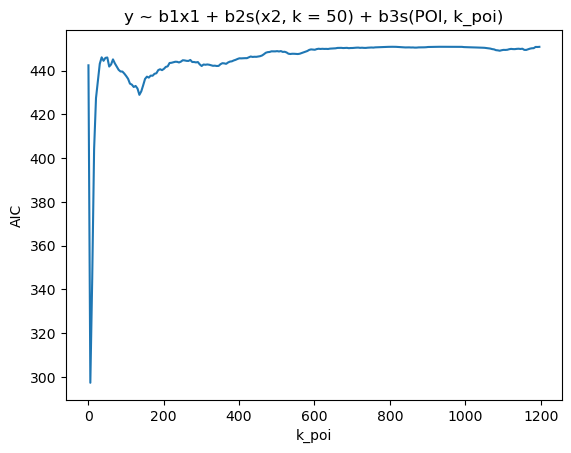

In [62]:
import matplotlib.pyplot as plt
plt.plot(np.arange(1, 1200, 5), aic_ls)
# Add labels
plt.xlabel("k_poi")  # Label for x-axis
plt.ylabel("AIC")  # Label for y-axis
plt.title("y ~ b1x1 + b2s(x2, k = 50) + b3s(POI, k_poi)")